In [203]:
#Importing libraries
import numpy as np
import pandas as pd
from typing import List, Optional
from tqdm import tqdm
from sklearn.utils.validation import check_is_fitted
import xgboost as xgb

import os
import json
import shap
import dill
import matplotlib.pyplot as plt
from collections import Counter
from PIL import  Image
import missingno as msno
%matplotlib inline

import seaborn as sns #visualization
import itertools
import warnings
warnings.filterwarnings("ignore")
import io
import plotly.offline as py#visualization
py.init_notebook_mode(connected=True)#visualization
import plotly.graph_objs as go#visualization
import plotly.tools as tls#visualization
import plotly.figure_factory as ff#visualization

from sklearn.model_selection import KFold, cross_val_score
from scipy.stats import shapiro, probplot, ttest_ind, mannwhitneyu, chi2_contingency, ks_2samp
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, scorer, log_loss
from sklearn.metrics import precision_score, recall_score, roc_auc_score, roc_curve, f1_score, cohen_kappa_score
from sklearn.metrics import accuracy_score, r2_score, mean_squared_error, mean_absolute_error

from pylab import rcParams

rcParams['figure.figsize'] = 8, 5
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 250)
plt.style.use('seaborn-whitegrid')
os.environ['KMP_DUPLICATE_LIB_OK']='True'

#### Задание 1: Сделать базовый анализ данных: вывести размерность датасетов, посчитать базовые статистики, выполнить анализ пропусков, сделать выводы;

In [ ]:
#скачал датасет отсюда https://www.kaggle.com/CooperUnion/cardataset
df = pd.read_csv("hw8_data.csv")

In [6]:
train = pd.read_csv("assignment1_data/train.csv")
test = pd.read_csv("assignment1_data/test.csv")

print("train.shape = {} rows, {} cols".format(*train.shape))
print("test.shape = {} rows, {} cols".format(*test.shape))

train.shape = 200000 rows, 202 cols
test.shape = 200000 rows, 201 cols


In [17]:
train.head(2)

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.093,11.4607,-9.2834,5.1187,18.6266,-4.9200,5.7470,2.9252,3.1821,14.0137,0.5745,8.7989,14.5691,5.7487,-7.2393,4.284,30.7133,10.5350,16.2191,2.5791,2.4716,14.3831,13.4325,-5.1488,-0.4073,4.9306,5.9965,-0.3085,12.9041,-3.8766,16.8911,11.1920,10.5785,0.6764,7.8871,4.6667,3.8743,-5.2387,7.3746,11.5767,12.0446,11.6418,-7.0170,5.9226,-14.2136,16.0283,5.3253,12.9194,29.0460,-0.6940,5.1736,-0.7474,14.8322,11.2668,5.3822,2.0183,10.1166,16.1828,4.9590,2.0771,-0.2154,8.6748,9.5319,5.8056,22.4321,5.0109,-4.7010,21.6374,0.5663,5.1999,8.8600,43.1127,18.3816,-2.3440,23.4104,6.5199,12.1983,13.6468,13.8372,1.3675,2.9423,-4.5213,21.4669,9.3225,16.4597,7.9984,-1.7069,-21.4494,6.7806,11.0924,9.9913,14.8421,0.1812,8.9642,16.2572,2.1743,-3.4132,9.4763,13.3102,26.5376,1.4403,14.7100,6.0454,9.5426,17.1554,14.1104,24.3627,2.0323,6.7602,3.9141,-0.4851,2.5240,1.5093,2.5516,15.5752,-13.4221,7.2739,16.0094,9.7268,0.8897,0.7754,4.2218,12.0039,13.8571,-0.7338,-1.9245,15.4462,12.8287,0.3587,9.6508,6.5674,5.1726,3.1345,29.4547,31.4045,2.8279,15.6599,8.3307,-5.6011,19.0614,11.2663,8.6989,8.3694,11.5659,-16.4727,4.0288,17.9244,18.5177,10.7800,9.0056,16.6964,10.4838,1.6573,12.1749,-13.1324,17.6054,11.5423,15.4576,5.3133,3.6159,5.0384,6.6760,12.6644,2.7004,-0.6975,9.5981,5.4879,-4.7645,-8.4254,20.8773,3.1531,18.5618,7.7423,-10.1245,13.7241,-3.5189,1.7202,-8.4051,9.0164,3.0657,14.3691,25.8398,5.8764,11.8411,-19.7159,17.5743,0.5857,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.389,12.3622,7.0433,5.6208,16.5338,3.1468,8.0851,-0.4032,8.0585,14.0239,8.4135,5.4345,13.7003,13.8275,-15.5849,7.800,28.5708,3.4287,2.7407,8.5524,3.3716,6.9779,13.8910,-11.7684,-2.5586,5.0464,0.5481,-9.2987,7.8755,1.2859,19.3710,11.3702,0.7399,2.7995,5.8434,10.8160,3.6783,-11.1147,1.8730,9.8775,11.7842,1.2444,-47.3797,7.3718,0.1948,34.4014,25.7037,11.8343,13.2256,-4.1083,6.6885,-8.0946,18.5995,19.3219,7.0118,1.9210,8.8682,8.0109,-7.2417,1.7944,-1.3147,8.1042,1.5365,5.4007,7.9344,5.0220,2.2302,40.5632,0.5134,3.1701,20.1068,7.7841,7.0529,3.2709,23.4822,5.5075,13.7814,2.5462,18.1782,0.3683,-4.8210,-5.4850,13.7867,-13.5901,11.0993,7.9022,12.2301,0.4768,6.8852,8.0905,10.9631,11.7569,-1.2722,24.7876,26.6881,1.8944,0.6939,-13.6950,8.4068,35.4734,1.7093,15.1866,2.6227,7.3412,32.0888,13.9550,13.0858,6.6203,7.1051,5.3523,8.5426,3.6159,4.1569,3.0454,7.8522,-11.5100,7.5109,31.5899,9.5018,8.2736,10.1633,0.1225,12.5942,14.5697,2.4

In [36]:
train.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,2000

In [26]:
#Разбиваем признаки по типам: числовые, нечисловые, цель
features = list(train.columns)
target = features.pop(1)
num_features = list(train[features].corr().columns)
dum_features = [x for x in features if x not in num_features]
print(f'Числовых признаков: {len(num_features)}')
print(f'Нечисловых признаков: {len(dum_features)}')

Числовых признаков: 200
Нечисловых признаков: 1


In [66]:
for col in num_features:
    if train[col].dtypes != 'float64':
        print(train[col].dtypes)

- Все признаки называются без определения типа данных и все числовые признаки типа float64

In [58]:
for col in train.columns:
    pct_missing = train[col].isnull().sum()
    if pct_missing != 0:
        print(f'{col} - {pct_missing} {round(pct_missing*100)}%')

- Пропусков нет

In [61]:
print('Признаки с выбросами в тренировочных данных:')
feat_outlier_train = []
for col in num_features:
    if train[col].max()<train[col].std()*3:
        feat_outlier_train.append(col)
train[feat_outlier_train].describe()

Признаки с выбросами в тренировочных данных:


,var_1,var_5,var_11,var_17,var_26,var_27,var_30,var_32,var_40,var_45,var_47,var_61,var_69,var_82,var_84,var_90,var_95,var_99,var_100,var_118,var_134,var_135,var_147,var_155,var_157,var_164,var_167,var_176,var_180,var_185,var_187,var_195,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,-1.627622,-5.065317,-3.245596,-5.696731,-4.055133,-1.137908,-7.687740,-0.512886,-6.725505,-12.699667,-12.471737,-11.946744,-3.331515,-3.471273,-2.590209,-16.548147,-0.084344,-0.746296,-6.600518,-5.305132,-4.826053,-4.259472,-3.300779,-2.074128,-4.813552,-2.871906,-4.151155,-2.799585,-2.741666,-3.983261,-10.335043,-0.142088,-3.326537
std,4.050044,7.863267,5.970253,6.712612,5.922210,1.523714,7.965198,2.587830,8.279259,21.404912,10.579862,11.622948,3.955723,8.479255,6.225305,13.152810,0.621125,1.862550,9.181683,8.799268,6.166126,7.617732,7.413301,5.771261,5.570272,5.457784,7.798020,7.513939,5.261243,4.725167,11.574708,1.429372,10.438015
min,-15.043400,-32.562600,-26.095000,-33.380200,-24.243100,-6.166800,-34.798400,-8.986100,-35.211700,-90.252500,-47.686200,-48.802700,-16.309400,-30.026600,-24.439800,-61.718000,-2.432400,-7.280600,-39.179100,-37.527700,-24.254600,-31.380800,-29.984000,-21.840900,-22.990400,-19.997700,-35.969500,-29.116500,-22.037400,-22.583300,-47.753600,-5.261000,-38.852800
25%,-4.740025,-11.200350,-7.510600,-10.476225,-8.321725,-2.307900,-13.766175,-2.500875,-12.831825,-28.730700,-20.654525,-20.901725,-6.336625,-10.004950,-7.216125,-26.665600,-0.527400,-2.106200,-13.198700,-11.587850,-9.625700,-9.957100,-8.751450,-6.266025,-8.939950,-7.094025,-9.643100,-8.386500,-6.673900,-7.360000,-19.205125,-1.170700,-11.208475
50%,-1.608050,-4.833150,-3.286950,-5.666350,-4.196900,-1.132100,-7.411750,-0.497650,-6.617450,-12.547200,-12.482400,-11.892000,-3.325500,-3.284450,-2.517950,-16.482600,-0.098600,-0.771300,-6.401500,-5.189500,-4.704250,-4.111900,-3.178700,-2.066100,-4.868400,-2.637800,-4.011600,-2.538450,-2.688800,-3.946950,-10.209750,-0.172700,-2.819550
75%,1.358625,0.924800,0.852825,-0.810775,-0.090200,0.015625,-1.443450,1.469100,-0.880875,3.150525,-4.244525,-3.225450,-0.498875,3.101725,1.986700,-6.409375,0.329100,0.528500,0.132100,0.971800,-0.178800,1.125950,2.028275,1.891750,-0.988575,1.323600,1.318725,2.704400,0.996200,-0.590650,-1.466000,0.829600,4.836800
max,10.376800,17.251600,17.188700,19.025900,15.675100,3.243100,15.651500,6.787100,18.105600,62.084400,20.685400,27.102900,8.547300,21.893400,17.742400,27.271300,1.804000,5.076400,25.140900,25.263500,12.723600,21.412800,22.149400,16.831600,11.972100,12.119300,21.276600,20.245200,12.750500,12.997500,22.786100,4.272900,28.500700


In [62]:
print('Признаки с выбросами в тестовыми данных:')
feat_outlier_test = []
for col in num_features:
    if test[col].max()<test[col].std()*3:
        feat_outlier_test.append(col)
test[feat_outlier_test].describe()

Признаки с выбросами в тестовыми данных:


,var_1,var_5,var_8,var_11,var_17,var_26,var_27,var_30,var_32,var_40,var_45,var_47,var_61,var_69,var_82,var_84,var_90,var_99,var_100,var_118,var_128,var_134,var_135,var_147,var_155,var_157,var_164,var_167,var_176,var_180,var_185,var_187,var_196,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.00000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,-1.624244,-5.050558,0.277135,-3.268551,-5.70445,-3.983721,-1.129536,-7.687695,-0.524830,-6.736054,-12.666095,-12.455577,-11.956023,-3.334390,-3.426199,-2.565281,-16.334976,-0.745673,-6.674013,-5.310524,-1.132617,-4.806086,-4.309017,-3.238206,-2.043747,-4.836848,-2.857328,-4.189133,-2.776134,-2.722636,-3.963045,-10.291919,2.290899,-3.246342
std,4.040509,7.869293,3.333375,5.961443,6.74646,5.945853,1.524765,7.971581,2.588700,8.298827,21.402708,10.535003,11.632700,3.959641,8.426273,6.228793,13.174833,1.868773,9.181642,8.767417,3.243374,6.170636,7.616104,7.444975,5.775461,5.576516,5.457937,7.827428,7.557001,5.225554,4.724641,11.562352,5.446346,10.398589
min,-15.043400,-27.767000,-9.956000,-25.811800,-28.90690,-24.536100,-6.040900,-34.054800,-8.209000,-34.952400,-83.692100,-46.554200,-48.336900,-15.538300,-30.314600,-24.563900,-57.385300,-7.364000,-40.949000,-38.295700,-11.514100,-25.002000,-28.480000,-29.788300,-22.410000,-24.955700,-21.514000,-37.176400,-29.838400,-20.610600,-22.467000,-47.306400,-13.944200,-39.457800
25%,-4.700125,-11.201400,-2.303900,-7.522000,-10.49790,-8.265500,-2.299000,-13.781900,-2.518200,-12.878300,-28.673200,-20.591000,-20.948500,-6.364100,-9.897300,-7.165400,-26.461300,-2.119700,-13.250800,-11.520900,-3.597500,-9.628800,-10.058525,-8.718200,-6.221800,-8.965800,-7.051200,-9.712000,-8.408100,-6.604425,-7.334000,-19.136225,-1.948600,-11.124000
50%,-1.590500,-4.834100,0.372000,-3.314950,-5.69820,-4.125800,-1.127800,-7.409000,-0.535200,-6.615750,-12.577800,-12.438800,-11.957200,-3.335600,-3.225700,-2.493900,-16.188350,-0.769500,-6.550400,-5.201200,-1.102900,-4.667800,-4.148100,-3.126700,-1.995000,-4.897700,-2.618500,-4.080550,-2.515400,-2.671600,-3.927300,-10.166800,2.403600,-2.725950
75%,1.343400,0.942575,2.930025,0.832525,-0.81160,-0.000700,0.026200,-1.464000,1.460225,-0.899000,3.094500,-4.304400,-3.228375,-0.501075,3.086950,2.022700,-6.207550,0.539425,0.042400,0.914700,1.363400,-0.142700,1.075900,2.057600,1.892750,-0.995600,1.330300,1.313125,2.737700,1.024600,-0.626300,-1.438800,6.519800,4.935400
max,9.385100,17.253700,9.665500,16.771300,19.15090,13.456400,3.371300,14.391500,6.949600,17.071700,58.307800,20.496900,26.399400,7.388400,21.294900,17.403000,22.337500,5.014400,24.073200,24.648900,8.930200,11.694900,19.725700,22.011800,16.821900,13.189700,11.885500,20.524400,19.677300,13.991000,12.488600,23.569900,15.920700,27.907400


In [63]:
print(f'Кол-во признаков с выбросами в тренировочных данных: {len(feat_outlier_train)}')
print(f'Кол-во признаков с выбросами в тестовых данных: {len(feat_outlier_test)}')

Кол-во признаков с выбросом в тренировочных данных: 33
Кол-во признаков с выбросом в тестовых данных: 34


In [76]:
for col in num_features:
    if train[col].nunique()<=train[col].count()/100:
        print('train', col, '/ Кол-во уников:', train[col].nunique(), '/ Всего значений:', train[col].count())
    if test[col].nunique()<=test[col].count()/100:
        print('test', col, '/ Кол-во уников:', test[col].nunique(), '/ Всего значений:', test[col].count())

train var_68 / Кол-во уников: 451 / Всего значений: 200000
test var_68 / Кол-во уников: 428 / Всего значений: 200000


- Все числовые признаки имеют относительно непрерывные значения. Наименьшее кол-во уникальных значений в признаке var_68

In [97]:
mw_lst = []
for col in num_features:
    sh_train = shapiro(train[col])[1]
    sh_test = shapiro(train[col])[1]
    if sh_train > 0.05:
        print('По тесту Шапиро распределение на трейне нормальное:', col, sh)
    else:
        col_target_0 = train.loc[train[target]==0, col]
        col_target_1 = train.loc[train[target]==1, col]
        mw = mannwhitneyu(col_target_0, col_target_1)[1]
        if mw > 0.05:
            print('По тесту Манна-Уитни мат.ожидания двух классов на трейне равны:', col, round(mw, 2))
            mw_lst.append(col)
    if sh_test > 0.05:
        print('По тесту Шапиро распределение на тесте нормальное:', col, sh)

По тесту Манна-Уитни мат.ожидания двух классов на трейне равны: var_7 0.06
По тесту Манна-Уитни мат.ожидания двух классов на трейне равны: var_10 0.17
По тесту Манна-Уитни мат.ожидания двух классов на трейне равны: var_17 0.32
По тесту Манна-Уитни мат.ожидания двух классов на трейне равны: var_27 0.42
По тесту Манна-Уитни мат.ожидания двух классов на трейне равны: var_30 0.36
По тесту Манна-Уитни мат.ожидания двух классов на трейне равны: var_38 0.33
По тесту Манна-Уитни мат.ожидания двух классов на трейне равны: var_39 0.06
По тесту Манна-Уитни мат.ожидания двух классов на трейне равны: var_41 0.29
По тесту Манна-Уитни мат.ожидания двух классов на трейне равны: var_96 0.11
По тесту Манна-Уитни мат.ожидания двух классов на трейне равны: var_98 0.05
По тесту Манна-Уитни мат.ожидания двух классов на трейне равны: var_100 0.21
По тесту Манна-Уитни мат.ожидания двух классов на трейне равны: var_103 0.24
По тесту Манна-Уитни мат.ожидания двух классов на трейне равны: var_117 0.07
По тесту М

- Тест Шапиро показал, что во всех признаках распределения не нормальные, как на трейне, так и на тесте.
- Тест Манна-Уитни выявил некоторые признаки, где скорей всего влияние на целевую переменную одинаковое, из-за равных мат.ожиданий

#### Оценим визуально признаки на нормальное распределение:

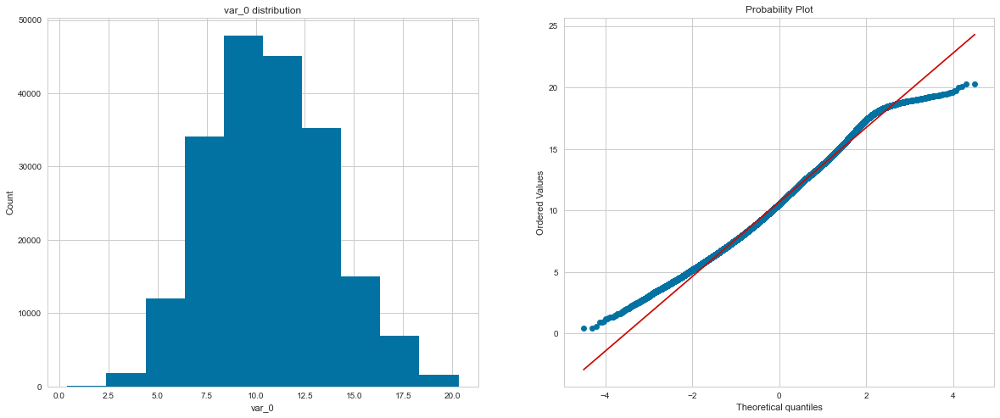

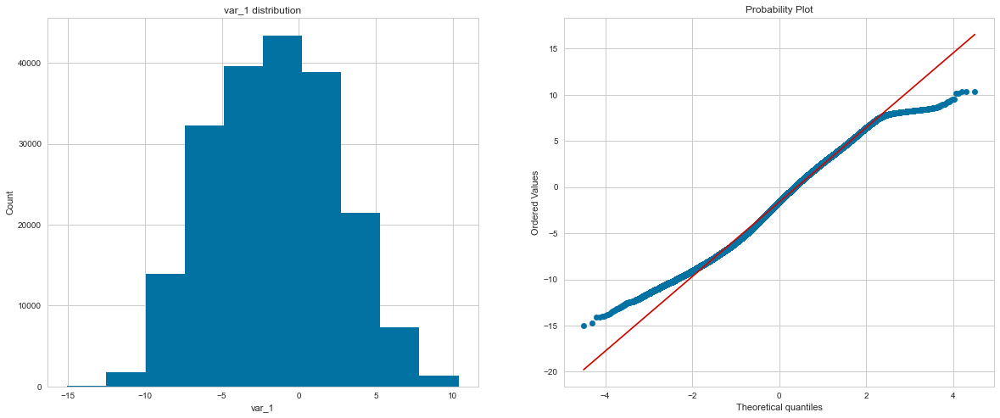

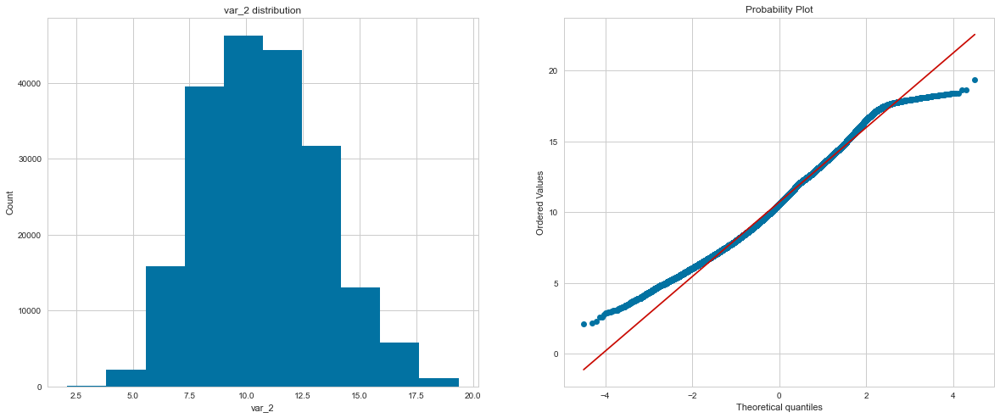

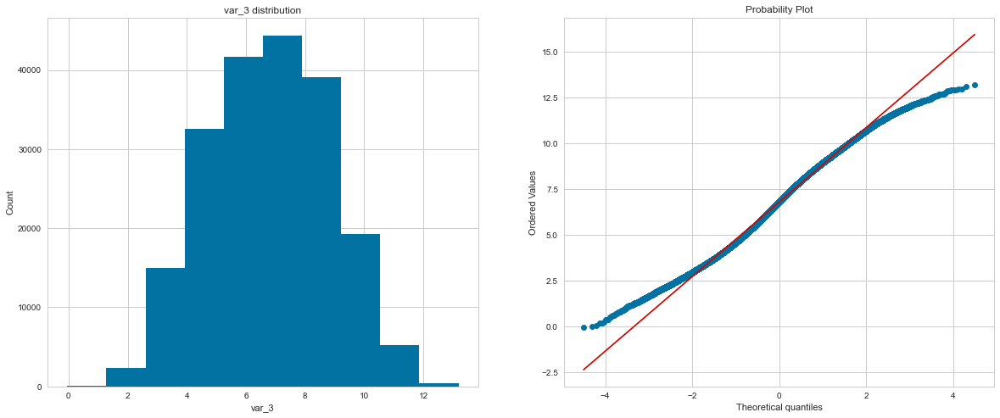

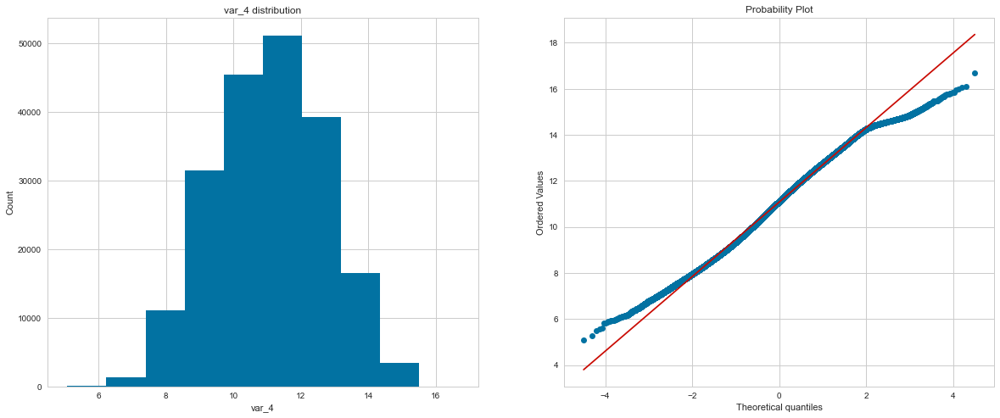

...

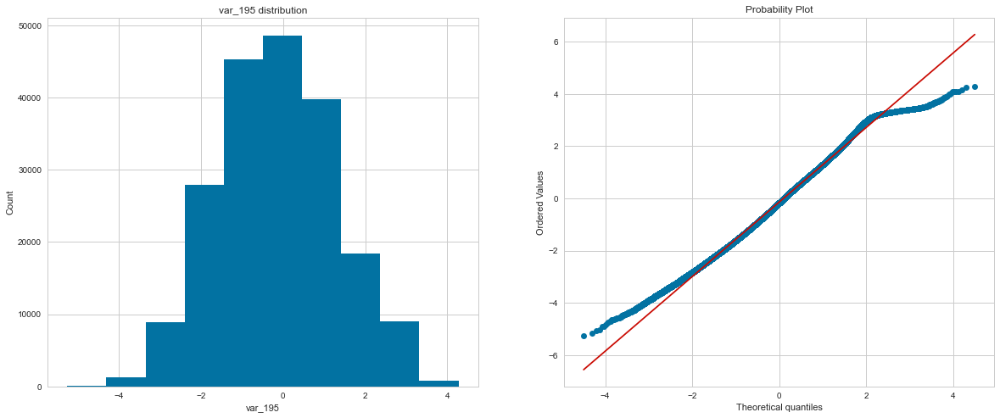

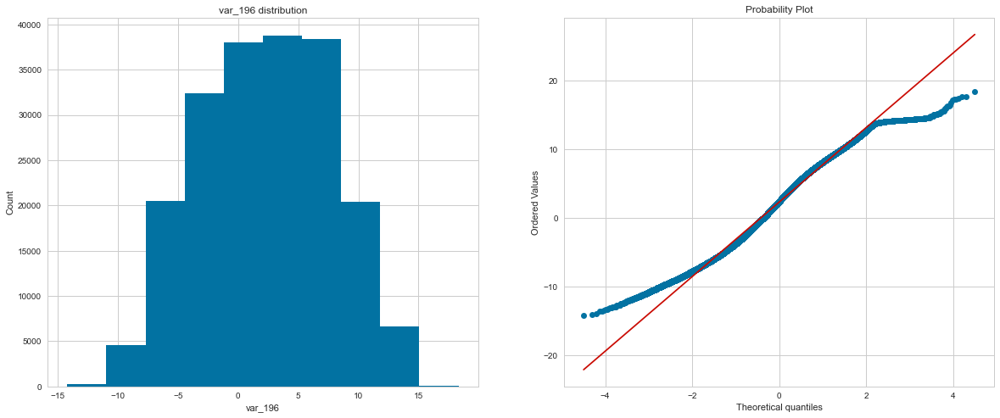

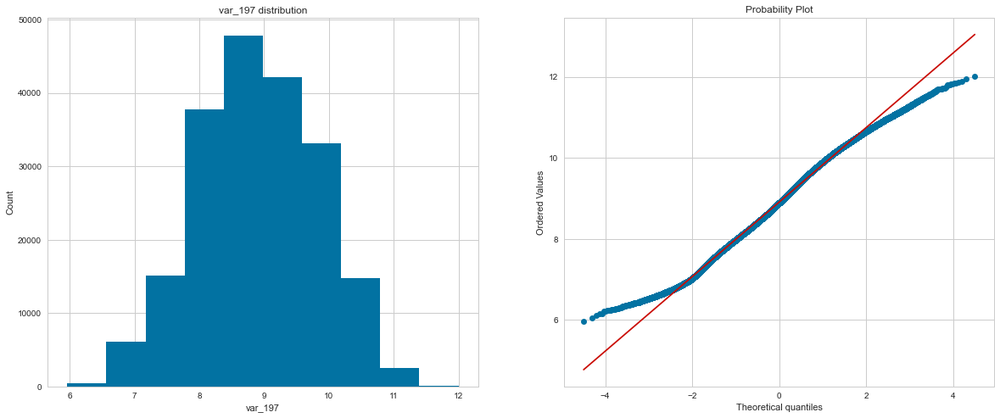

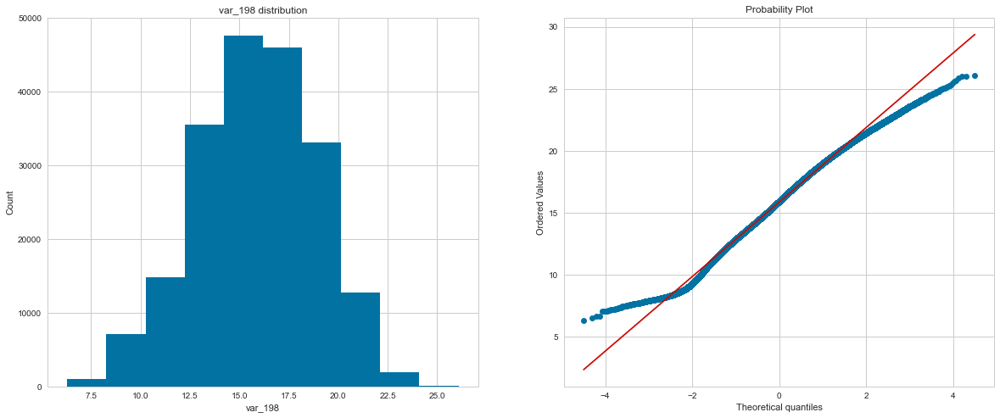

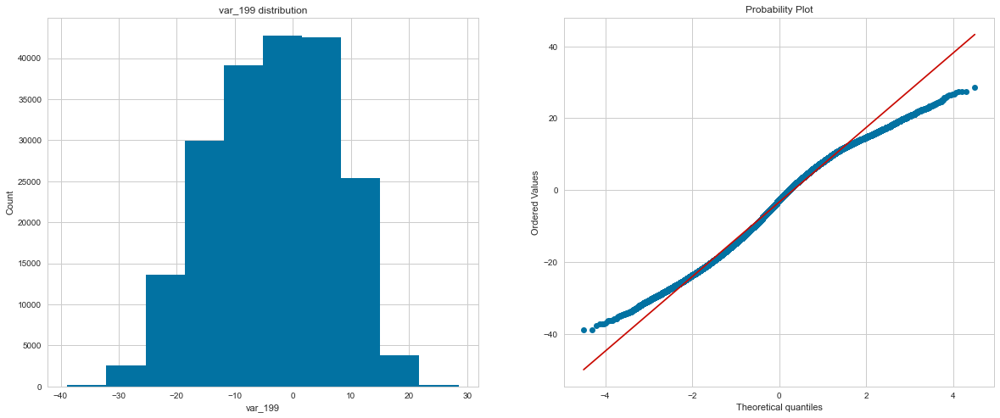

In [96]:
for v in num_features:
    s_v = train.loc[train[v].notna(), v]
    plt.figure(figsize=(20, 8))

    ax1 = plt.subplot(121)
    ax1.set_xlabel(v)
    ax1.set_ylabel('Count')
    ax1.set_title(f'{v} distribution')
    s_v.hist()

    plt.subplot(122)
    probplot(s_v, dist='norm', plot=plt)


    plt.show()

- Визуально все распределение всех признаков близко к нормальному, но тесты показывают, что они не нормальные

#### Оценим визуально равенство мат.ожиданий для признаков, которые по тесту Манна-Уитни подтвердили гипотезу о равенстве:

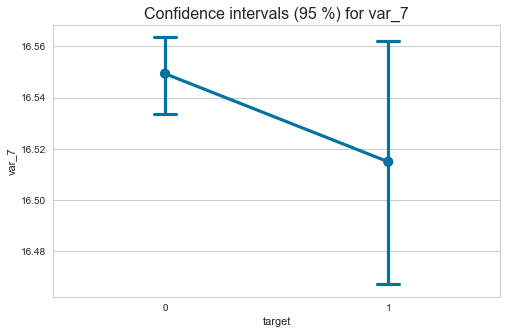

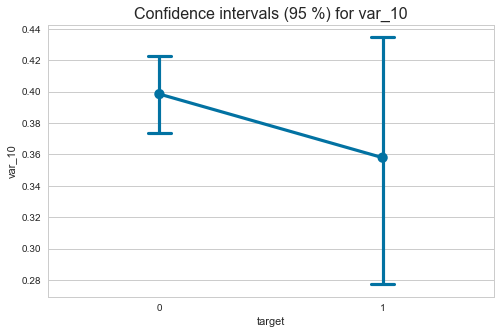

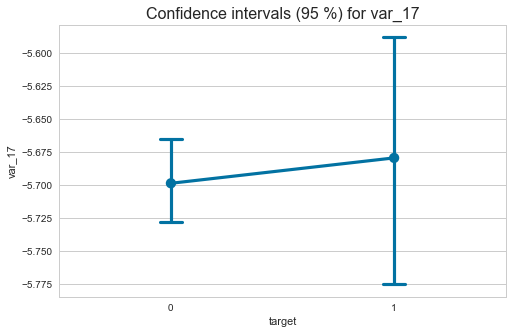

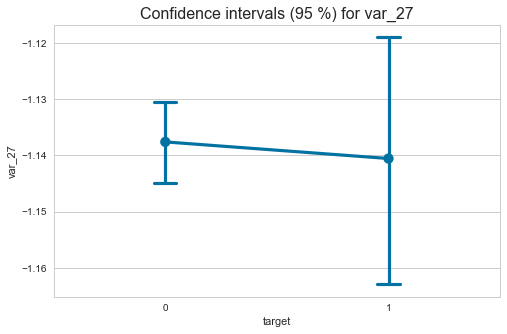

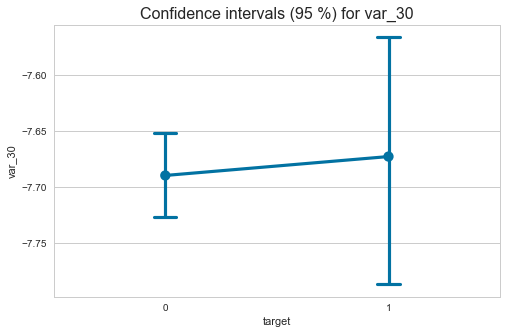

...

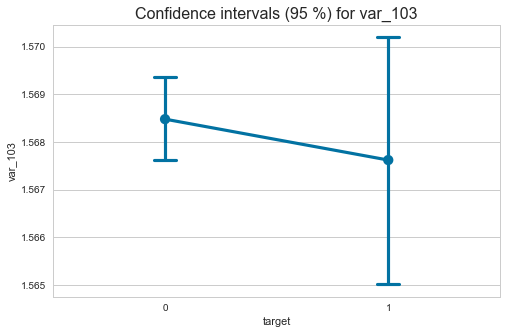

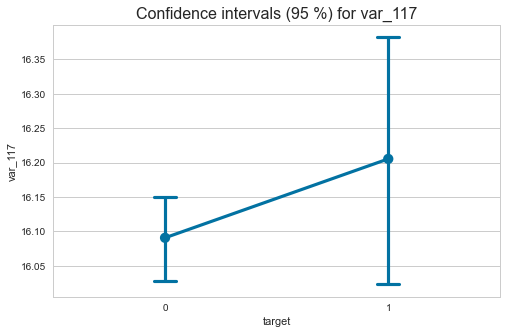

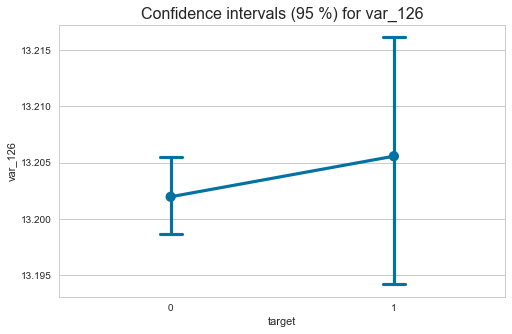

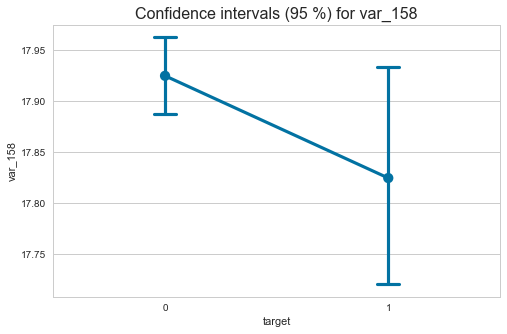

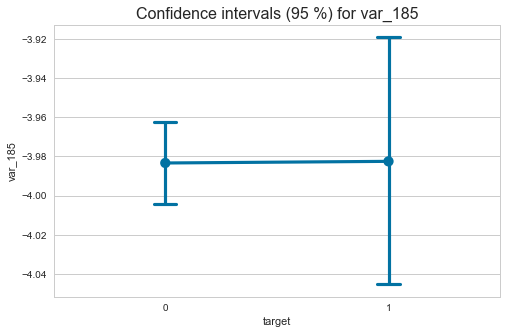

In [99]:
for v in mw_lst:
    df_v = train.loc[train[v].notna()]
    plt.figure(figsize=(8, 5))

    sns.pointplot(x=target, y=v, data=train, capsize=.1)

    plt.title(f'Confidence intervals (95 %) for {v}', fontdict={'fontsize': 16})
    plt.show()

- Визуально видно, что мат.ожидания практически равны у признаков: __var_17, var_27, var_30, var_185__. По идее их можно не брать в модель, но это стоит проверить отдельно

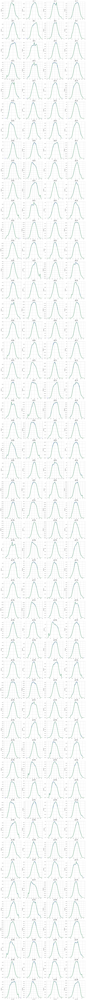

In [107]:
fig, axes = plt.subplots(50, 4, figsize=(20, 250))

for num, feature in enumerate(num_features):
    try:
        train_data, test_data = train[feature].copy(), test[feature].copy()
        sns.kdeplot(train_data, ax=axes[num//4, num%4], color="blue", label="train")
        sns.kdeplot(test_data, ax=axes[num//4, num%4], color="green", label="test")
    except RuntimeError:
        pass
    except KeyError:
        train_data = train[feature].copy()
        sns.kdeplot(train_data, ax=axes[num//4, num%4], color="blue", label="train")
    axes[num//4, num%4].set_title(feature, fontsize=14)

- Распределения на тесте и трейне по всем признакам почти идентичные

#### Посмотрим на баланс распределения целевого признака:

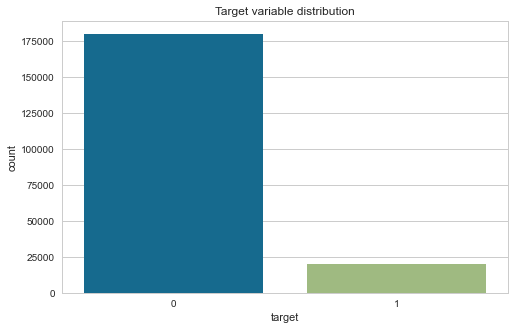

In [95]:
plt.figure(figsize=(8, 5))

sns.countplot(x=target, data=train)

plt.title('Target variable distribution')
plt.show()

- Целевой класс в сильном дисбалансе в сторону нулевого значения. В моделе придется применять балансировку классов.

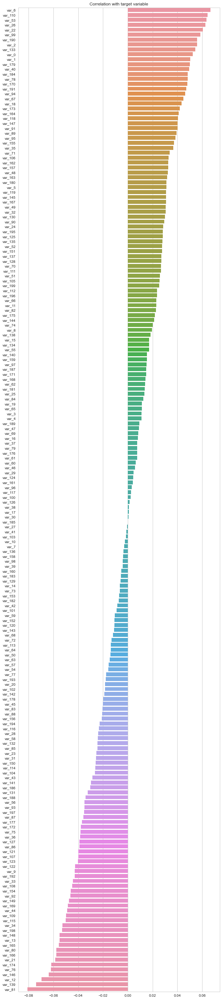

In [132]:
correlation = train[num_features+[target]].corr()
target_corr = correlation.iloc[:, 200].sort_values(ascending=False)[1:]

xs = target_corr.values
ys = target_corr.index

plt.figure(figsize=(10, 50))

sns.barplot(x=xs, y=ys)

plt.title('Correlation with target variable')
plt.show()

In [130]:
print('Кол-во признаков, коррелирующих с целевой переменной (>0.2):', target_corr.loc[abs(target_corr)>0.2].shape[0])

Кол-во признаков, коррелирующих с целевой переменной (>0.2): 0


- У всех признаков очень слабая корреляция с целевой переменной

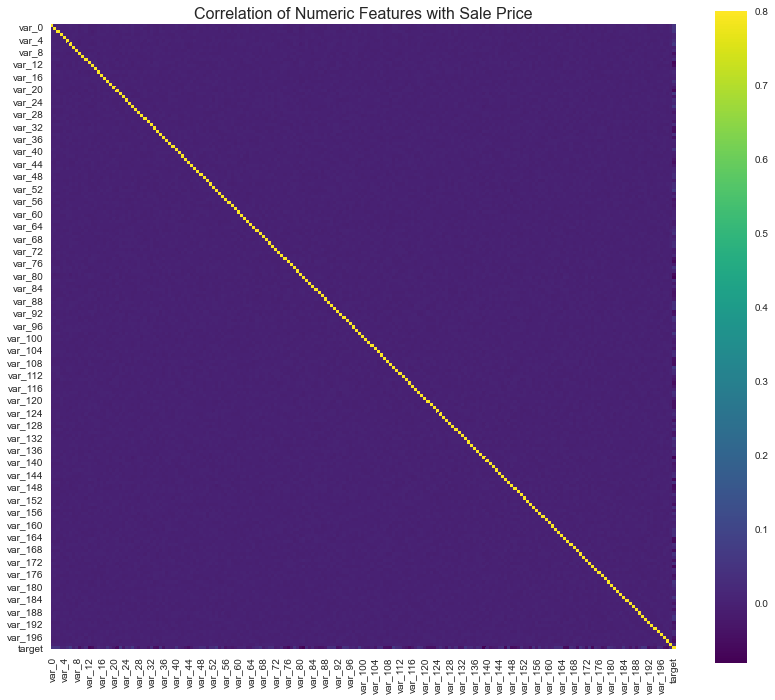

In [133]:
fig, axes = plt.subplots(figsize = (14,12))
plt.title("Correlation of Numeric Features with Sale Price", y=1, size=16)
sns.heatmap(correlation, square=True, vmax=0.8, cmap="viridis")

- Между собой признаки не коррелируют вообще

#### Посмотрим на распределение признаков по классам цели:

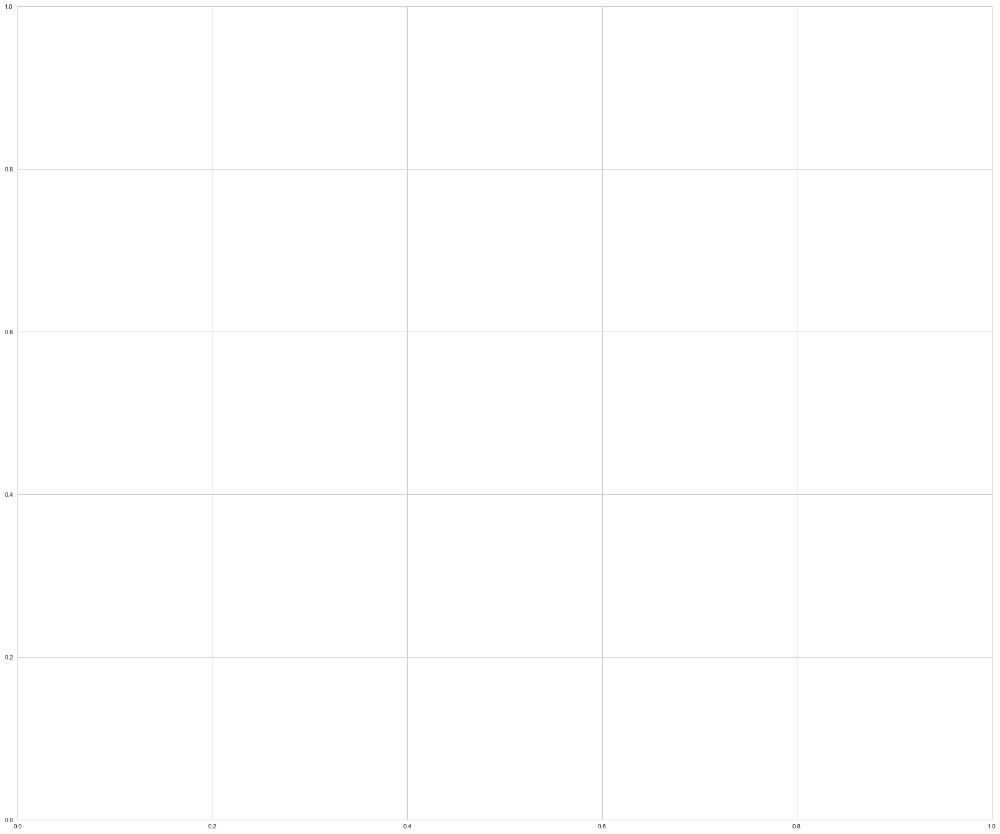

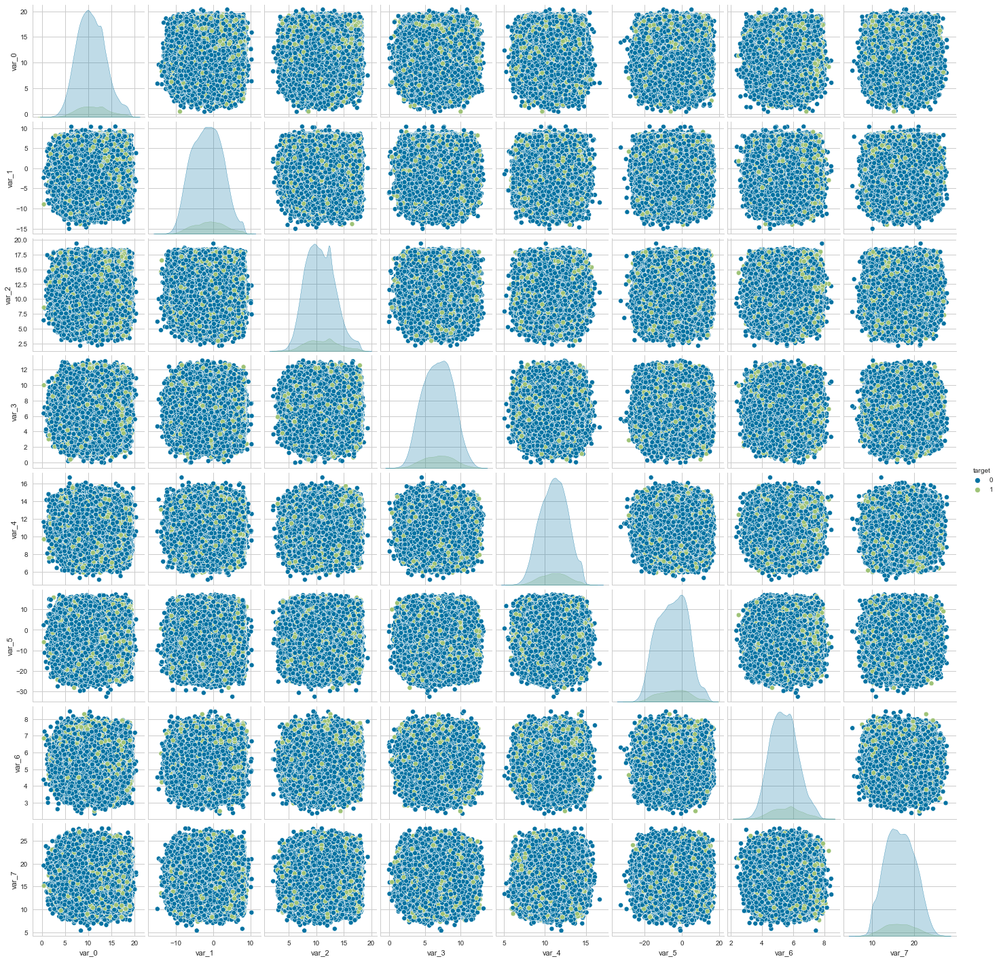

In [135]:
fig, axes = plt.subplots(figsize = (28,24))
sns_plot = sns.pairplot(train[num_features[0:8] + [target]], hue=target)

- В первых 8 признаках видно, как выглядит распределение по классам. 
- Все очень хаотично, но заметны некоторые зоны, где кучкуется 1-й класс. Скорей всего визуально в других признаках тоже не найдем ничего существенного, т.к. корреляции между ними нет.

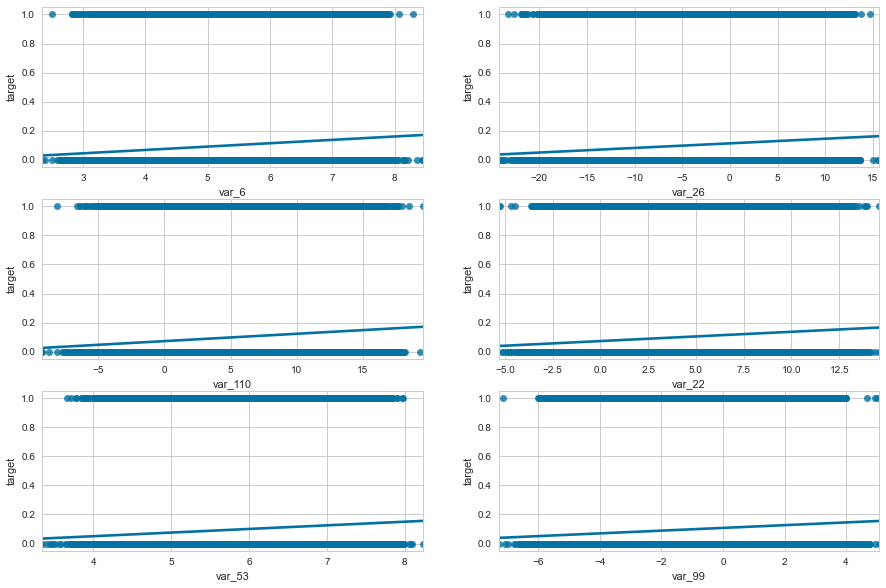

In [149]:
fig, axes = plt.subplots(3, 2, figsize=(15, 10))
for num, feature in enumerate(target_corr[:6].index.tolist()):
    sns.regplot(
        x=feature,
        y=target,
        data=train,
        ax=axes[num%3, num//3],
        scatter=True,
        fit_reg=True
    )

- Scaterplot'ы по этим признакам ничего не показывают.

#### Посмотрим на категориальный признак:

In [157]:
print('Кол-во уников в трейне:', 
      train[dum_features[0]].nunique(), train[dum_features[0]].nunique()/train[dum_features[0]].count()*100, '%')
print('Кол-во уников в тесте:', 
      test[dum_features[0]].nunique(), test[dum_features[0]].nunique()/test[dum_features[0]].count()*100, '%')

Кол-во уников в трейне: 200000 100.0 %
Кол-во уников в тесте: 200000 100.0 %


In [158]:
train[dum_features[0]]

0              train_0
1              train_1
2              train_2
3              train_3
4              train_4
              ...     
199995    train_199995
199996    train_199996
199997    train_199997
199998    train_199998
199999    train_199999
Name: ID_code, Length: 200000, dtype: object

- Кол-во уникальных значений по категориальному признаку равно кол-ву наблюдений. Получается, что это просто номер наблюдения, который можно не учитывать в обучении

#### Посмотрим на нелинейную связь между признаками:

In [173]:
%%time
parameters = {"max_depth": 6, "n_estimators": 25, "random_state": 27, "n_jobs": -1}
X = train[num_features]
y = train[target]

forest = RandomForestClassifier(**parameters)
forest.fit(X, y)

Wall time: 4min 31s


RandomForestClassifier(max_depth=6, n_estimators=25, n_jobs=-1, random_state=27)

In [162]:
def show_feature_importances(feature_names, feature_importances, get_top=None):
    feature_importances = pd.DataFrame({'feature': feature_names, 'importance': feature_importances})
    feature_importances = feature_importances.sort_values('importance', ascending=False)
       
    plt.figure(figsize = (20, len(feature_importances) * 0.5))
    
    sns.barplot(feature_importances['importance'], feature_importances['feature'])
    
    plt.xlabel('Importance')
    plt.title('Importance of features')
    plt.show()
    
    if get_top is not None:
        return feature_importances['feature'][:get_top].tolist()

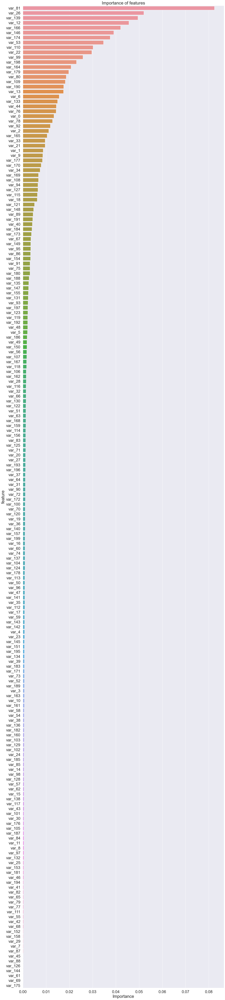

In [174]:
sns.set(font_scale = 2)
important_features_top = show_feature_importances(num_features, forest.feature_importances_, get_top=10)
sns.set(font_scale = 1)

- Получаем ТОП10 признаков, которые имеют максимальную нелинейную корреляцию с целевой переменной:

In [175]:
important_features_top

['var_81',
 'var_26',
 'var_139',
 'var_12',
 'var_166',
 'var_146',
 'var_174',
 'var_53',
 'var_110',
 'var_22']

#### Вычислим критерий однородности Колмогорова-Смирнова для анализа идентичности тренировочной и тестовой выборки. Для скорости тест сделаем на ТОП10 нелинейно-связанных признаках

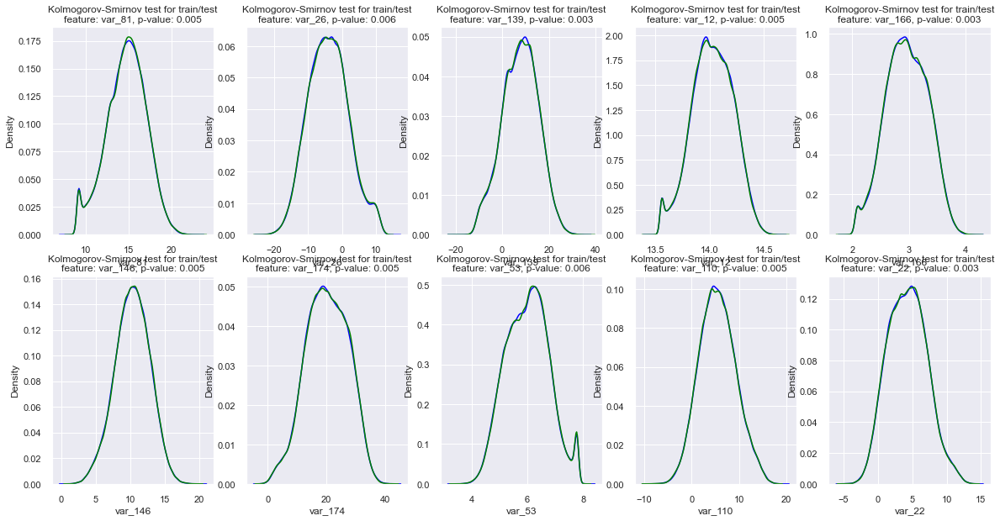

In [183]:
statistics_array = []
fig, axes = plt.subplots(2, 5, figsize=(20, 10))

for num, feature in enumerate(important_features_top):
    statistic, pvalue = ks_2samp(
        train[feature], test[feature]
    )
    statistics_array.append(statistic)

    sns.kdeplot(train[feature], ax=axes[num//5, num%5], color="Blue", label="Train")
    sns.kdeplot(test[feature], ax=axes[num//5, num%5], color="Green", label="Test")

    axes[num//5, num%5].set_title(
        (f"Kolmogorov-Smirnov test for train/test\n"
        f"feature: {feature}, p-value: {round(statistic, 3)}")
    )

- По критерию Колмогорова-Смирнова везде p-value меньше 0.05, а значит во всех проверенных признаках мы отклоняем гипотезу о совпадении распределения трейна и теста

In [185]:
class PSI(BaseEstimator, TransformerMixin):
    """
    Вычисление PSI и отбор признаков на их основе.

    Parameters
    ----------
    threshold: float
        Порог для отбора переменных по PSI.
        Если PSI для переменной выше порога - переменная макрируется
        0 (не использовать для дальнейшего анализа), если ниже
        порога - маркируется 1 (использовать для дальнейшего анализа).

    categorical_features: List[str], optional, default = None
        Список категориальных признаков для анализа.
        Опциональный параметр, по умолчанию, не используется, т.е.
        категориальные признаки отсутствуют.

    n_bins: int, optional, default = 20
        Количество бинов, на которые разбивается выборка.

    min_value: float, optional, default = 0.005
        Значение которое используется, если рассчитанный psi = 0.

    bin_type: string, optional, default = "quanitles"
        Способ разбиения на бины: "quantiles" or "bins".
        При выборе "quantiles" - выборка будет разбита на n_bins
        квантилей, при выборке "bins" - выборка будет разбита на
        n_bins бакетов с равным шагом между бакетами.
        Иные значения приводят к возникновению ValueError.

    Attributes
    ----------
    scores_: Dict[str, float]
        Словарь со значениями PSI,
        ключ словаря - название признака, значение - PSI-score.

    """
    def __init__(self,
                 threshold: float,
                 categorical_features: Optional[List[str]] = None,
                 bin_type: str = "quantiles",
                 min_value: float = 0.005,
                 n_bins: int = 20):

        self.threshold = threshold
        self.categorical_features = categorical_features
        self.min_value = min_value
        self.n_bins = n_bins
        if bin_type in ["quantiles", "bins"]:
            self.bin_type = bin_type
        else:
            raise ValueError(
                "Incorrect bin_type value. Expected 'quantiles' or 'bins', "
                f"but {bin_type} is transferred."
            )
        self.scores = {}

    def calculate_bins(self, data: pd.Series) -> np.array:
        """
        Вычисление границ бинов для разбиения выборки.

        Parameters
        ----------
        data: pandas.Series, shape = [n_samples, ]
            наблюдения из train-выборки.

        Returns
        -------
        bins: numpy.array, shape = [self.n_bins + 1]
            Список с границами бинов.

        """
        if self.bin_type == "quantiles":
            bins = np.linspace(0, 100, self.n_bins + 1)
            bins = [np.nanpercentile(data, x) for x in bins]

        else:
            bins = np.linspace(data.min(), data.max(), self.n_bins + 1)

        return np.unique(bins)

    def calculate_psi_in_bin(self, expected_score, actual_score) -> float:
        """
        Вычисление значения psi для одного бакета.

        Осуществляется проверка на равенство нулю expected_score и
        actual_score: если один из аргументов равен нулю, то его
        значение заменяется на self.min_value.

        Parameters
        ----------
        expected_score: float
            Ожидаемое значение.

        actual_score: float
            Наблюдаемое значение.

        Returns
        -------
        value: float
            Значение psi в бине.

        """
        if expected_score == 0:
            expected_score = self.min_value
        if actual_score == 0:
            actual_score = self.min_value

        value = (expected_score - actual_score)
        value = value * np.log(expected_score / actual_score)

        return value

    def calculate_psi(self, expected: pd.Series, actual: pd.Series, bins) -> float:
        """
        Расчет PSI для одной переменной.

        Parameters
        ----------
        expected: pandas.Series, shape = [n_samples_e, ]
            Наблюдения из train-выборки.

        actual: pandas.Series, shape = [n_samples_o, ]
            Наблюдения из test-выборки.

        bins: pandas.Series, shape = [self.n_bins, ]
            Бины для расчета PSI.

        Returns
        -------
        psi_score: float
            PSI-значение для данной пары выборок.

        """
        expected_score = np.histogram(expected.fillna(-9999), bins)[0]
        expected_score = expected_score / expected.shape[0]

        actual_score = np.histogram(actual.fillna(-9999), bins)[0]
        actual_score = actual_score / actual.shape[0]

        psi_score = np.sum(
            self.calculate_psi_in_bin(exp_score, act_score)
            for exp_score, act_score in zip(expected_score, actual_score)
        )

        return psi_score

    def calculate_numeric_psi(self, expected: pd.Series, actual: pd.Series) -> float:
        """
        Вычисление PSI для числовой переменной.

        Parameters
        ----------
        expected: pandas.Series, shape = [n_samples_e, ]
            Наблюдения из train-выборки.

        actual: pandas.Series, shape = [n_samples_o, ]
            Наблюдения из test-выборки.

        Returns
        -------
        psi_score: float
            PSI-значение для данной пары выборок.

        """
        bins = self.calculate_bins(expected)
        psi_score = self.calculate_psi(expected, actual, bins)
        return psi_score

    def calculate_categorical_psi(self, expected: pd.Series, actual: pd.Series) -> float:
        """
        Вычисление PSI для категориальной переменной.
        PSI рассчитывается для каждого уникального значения категории.

        Parameters
        ----------
        expected: pandas.Series, shape = [n_samples_e, ]
            Наблюдения из train-выборки.

        actual: pandas.Series, shape = [n_samples_o, ]
            Наблюдения из test-выборки.

        Returns
        -------
        psi_score: float
            PSI-значение для данной пары выборок.

        """
        bins = np.unique(expected).tolist()
        psi_score = self.calculate_psi(expected, actual, bins)
        return psi_score

    def fit(self, X, y=None):
        """
        Вычисление PSI-значения для всех признаков.

        Parameters
        ----------
        X: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для обучения.

        y: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для тестирования.

        Returns
        -------
        self
        """
        missed_columns = list(set(X.columns) - set(y.columns))

        if missed_columns:
            raise MissedColumnError(
                f"Missed {list(missed_columns)} columns in data.")

        if self.categorical_features:
            numeric_features = list(
                set(X.columns) - set(self.categorical_features)
            )
            for feature in self.categorical_features:
                self.scores[feature] = self.calculate_categorical_psi(
                    X[feature], y[feature]
                )
        else:
            numeric_features = X.columns

        for feature in tqdm(numeric_features):
            self.scores[feature] = self.calculate_numeric_psi(
                X[feature], y[feature]
            )
        return self

    def transform(self, X, y=None) -> pd.DataFrame:
        """
        Отбор переменных по self.threshold.
        Если PSI-score для переменной выше порога, то переменная
        помечается 0 (не использовать для дальнейшего анализа), если ниже
        порога - маркируется 1 (использовать для дальнейшего анализа).

        Parameters
        ----------
        data: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для обучения.

        target: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для тестирования.

        Returns
        -------
        scores: pandas.DataFrame, shape = [n_features, 3]
            Датафрейм с PSI-анализом переменных.

        """
        check_is_fitted(self, "scores")
        scores = pd.Series(self.scores)
        scores = pd.DataFrame({"Variable": scores.index, "PSI": scores.values})
        scores["Selected"] = np.where(scores.PSI < self.threshold, 1, 0)
        scores = scores.sort_values(by="PSI")

        mask = scores["Selected"] == 1
        self.used_features = scores.loc[mask, "Variable"].tolist()

        return scores.reset_index(drop=True)

In [195]:
%%time
psi = PSI(threshold=0.01)
psi.fit_transform(
    X=train[num_features],
    y=test[num_features]
)

100%|████████████████████████████████████████████████████████████████████████████████| 200/200 [00:16<00:00, 12.26it/s]


Wall time: 16.7 s


,Variable,PSI,Selected
0,var_154,0.000085,1
1,var_156,0.000132,1
2,var_5,0.000138,1
3,var_148,0.000150,1
4,var_35,0.000151,1
5,var_197,0.000168,1
6,var_36,0.000169,1
7,var_179,0.000179,1
8,var_71,0.000179,1
9,var_61,0.000183,1


- По проверке через вычисление PSI все признаки имеют разное распределение на трейне и тесте, что подтверждает критерий Колмогорова-Смирнова.

#### Проанализируем трейн и тест с помощью Adversarial Validation

In [196]:
X_adv = pd.concat([
    train[num_features], test[num_features]
])
y_adv = np.hstack(
    (np.ones(train.shape[0]), np.zeros(test.shape[0])))

X_adv = X_adv.reset_index(drop=True)

In [201]:
len(X_adv), len(y_adv)

(400000, 400000)

In [204]:
%%time
parameters = {"max_depth": 4, "n_estimators": 50, "random_state": 27, "n_jobs": -1}
model = xgb.XGBClassifier(**parameters)

cv = cross_val_score(
    estimator=model,
    X=X_adv, y=y_adv,
    scoring="roc_auc",
    cv=KFold(n_splits=3, shuffle=True, random_state=27)
)

print(f"CV-score: {round(np.mean(cv), 4)}")

CV-score: 0.5116
Wall time: 3min 22s


- Значение roc_auc близко к 0.5, а значит распределение значений на трейне и тесте практически одинаковое.

In [205]:
model.fit(X_adv, y_adv)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=4,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=50, n_jobs=-1, num_parallel_tree=1, random_state=27,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

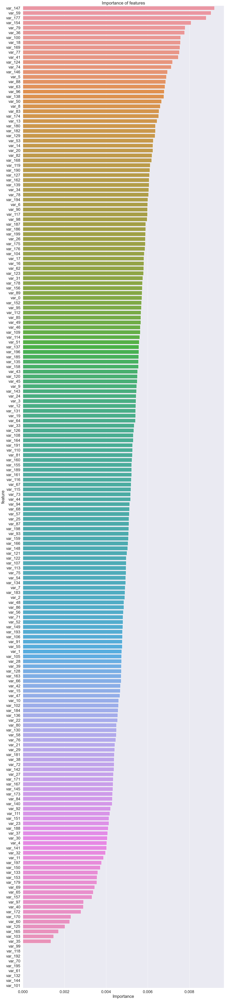

In [207]:
sns.set(font_scale = 2)
important_features_top = show_feature_importances(num_features, model.feature_importances_, get_top=10)
sns.set(font_scale = 1)

In [209]:
print('Наибольшая разница трейна и теста в признаках:', important_features_top)

Наибольшая разница трейна и теста в признаках: ['var_147', 'var_59', 'var_177', 'var_154', 'var_79', 'var_36', 'var_100', 'var_18', 'var_169', 'var_77']
